[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/mdehling/neural-style-transfer/blob/main/johnson2016.ipynb)

# Introduction
In this notebook I give a brief overview of Johnson's approach to neural style transfer introduced in his article _Perceptual Losses for Real-Time Style Transfer and Super-Resolution_ [1] (for more details, see also the supplementary material [2] and Lua/Torch code [3] for his article.)

Let $x_S$ be the chosen style image and denote by $T_S$ the _image transformation network_ mapping any input image $x$ to an output image $y = T_S(x)$ of the same size.  The goal is to produce output images $y$ that look like a version of the input $x$ in the style of $x_S$.  The objective formulated to achieve this goal is to minimize a weighted sum
$$ \mathcal{L} = w_S \mathcal{L}_S + w_C \mathcal{L}_C + w_V \mathcal{L}_V \quad, $$
where $\mathcal{L}_S$ and $\mathcal{L}_C$ denote the style and content loss as introduced by Gatys et al in [5,6], and $\mathcal{L}_V$ denotes the output image's total variation.

Note that the total loss $\mathcal{L}$ here is defined exactly as in Gatys' image optimization approach, except that there is no fixed content image $x_C$.  The role of the content image is played by different input images $x$ at each step of the training process for the network $T_S$.  The style loss is measured between the output image $y$ and the (fixed) style image $x_S$, the content loss is measured between the input $x$ and its output $y = T_S(x)$, and the variation loss depends only on the output image $y$.

In [1]:
try:
    from google import colab
    RUNNING_ON_COLAB = True

    !git init .
    !git remote add origin https://github.com/mdehling/neural-style-transfer.git
    !git pull --depth=1 origin main
    !git submodule update --init

except:
    RUNNING_ON_COLAB = False

In [2]:
import os, re
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'         # hide info & warnings
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true' # grow GPU memory as needed

import tensorflow as tf
import tensorflow.keras.backend as K
import tensorflow_datasets as tfds

import nstesia as nst

tfds.disable_progress_bar()                      # progress bar mangles output

You will most likely want to leave `TRAINING_MODE` set to `False`.  Setting it to `True` will at the very least trigger the download of a 37gb dataset (MS-COCO/2014.)  This dataset is **not needed** unless you want to train the transfer model for your own style images.  I provide pre-trained weights for a variety of styles that you can experiment with.

In [3]:
TRAINING_MODE = False

# The Image Transformation Network
The following is an overview of the architecture of Johnson's image transformation network.  The model uses an encoder-decoder architecture with residual blocks as bottleneck to facilitate learning of the identity transformation.  It is fully convolutional and can be applied to arbitrary size input images; the output size is listed only to illustrate the bottleneck structure and is based on an input image size of 256x256x3.  See below for some clarifying remarks about the model layers.

    (Block /) Layer             Description                             Output Size
    -------------------------------------------------------------------------------
    input                       Input Layer                             256x256x3

    preprocess                  Pre-Processing                          256x256x3
    rpad                        Reflection Padding (40x40)              336x336x3

    conv_block_1 / conv         Convolution (32, size 9x9, stride 1)
                 / norm         BatchNormalization
                 / act          Activation (ReLU)                       336x336x3

    conv_block_2 / conv         Convolution (64, size 3x3, stride 2)
                 / norm         BatchNormalization
                 / act          Activation (ReLU)                       168x168x64

    conv_block_3 / conv         Convolution (128, size 3x3, stride 2)
                 / norm         BatchNormalization
                 / act          Activation (ReLU)                       84x84x128

    res_block_1..5 / conv1      Convolution (128, size 3x3, stride 1)
                   / norm1      BatchNormalization
                   / relu1      Activation (ReLU)
                   / conv2      Convolution (128, size 3x3, stride 1)
                   / norm2      BatchNormalization
                   + crop       Residual = Cropping (2x2)               80x80x128..
                                                                        ..64x64x128

    conv_block_4 / conv         Convolution (64, size 3x3, stride 1/2)
                 / norm         BatchNormalization
                 / act          Activation (ReLU)                       128x128x64

    conv_block_5 / conv         Convolution (32, size 3x3, stride 1/2)
                 / norm         BatchNormalization
                 / act          Activation (ReLU)                       256x256x32

    conv_block_6 / conv         Convolution (3, size 9x9, stride 1)
                 / act          Activation (TanH)                       256x256x3

    rescale                     Rescaling (factor 150.0)                256x256x3
    postprocess                 Post-Processing                         256x256x3

**REMARKS:**
- The pre- and postprocessing layers (de)normalize with respect to the ImageNet mean RGB values.  Postprocessing also performs clipping to the 0.0..255.0 range.
- The convolutional blocks use 'same' padding, the residual blocks use none.  Instead, a layer of reflection padding is applied early in the model.  This approach is intended to minimize boundary artifacts.
- Since the convolutions in the residual blocks use no padding, their output is 2 pixels smaller on all sides.  Hence, the residual connection cannot be an identity map and instead a 2x2 cropping layer is used.
- Ulyanov et al in their article _Instance Normalization: The Missing Ingredient for Fast Stylization_ [7] suggested using instance normalization instead of batch normalization for better results.

You can find my implementation of the image transformation network as a keras sequential model in [`nstesia.models.JohnsonStyleTransfer`](https://github.com/mdehling/nstesia/blob/main/models/johnson_transfer.py).

# Loading the Training Data
We use the same dataset (MS-COCO/2014, [4]) for training as Johnson did in his original work.

**NOTE:** The cell below will download about 37GB of data and will need roughly 150GB of free space in `data_dir`.  On Google Colab Pro this takes about 1 hour, on GitHub Codespaces about 20 minutes.

In [4]:
if TRAINING_MODE is True:
    train_ds = tfds.load('coco/2014', split='train', data_dir='/tmp')

    train_ds = train_ds.map( lambda data: tf.cast(data['image'], dtype=tf.float32) )
    train_ds = train_ds.map( lambda image: tf.image.resize(image, [256,256]) )
    train_ds = train_ds.map( lambda image: (image,image) )
    train_ds = train_ds.batch(4).prefetch(tf.data.AUTOTUNE)

# Training the Transfer Model
The dictionary below maps styles to their parameters: the file containing the style image, a triple $(w_S,w_C,w_V)$ of weights for style/content/variation loss, and (optionally) a parameter indicating the type of normalization to use ('instance' or 'batch').  The parameters are used for the training setup in the cell below.

Training takes about 30 minutes per epoch on an NVIDIA Tesla V100 as provided by GitHub Codespaces.  The model for each style is trained for 2 epochs, so the total training time is about 1 hour per style in the dictionary below.  Using instance normalization instead of the default batch normalization increases the training time by about 30 percent.  On Colab Pro the training process will take twice as long.

Note that model checkpoints are saved at the end of each epoch and these are used to show some results in the section below.

In [5]:
style_parameters = {
    'candy-s6-v-3':            { 'file': 'img/candy.jpeg',         'weights':  (6.0, 1.0, 1e-3) },
    'candy-s8-v-3':            { 'file': 'img/candy.jpeg',         'weights':  (8.0, 1.0, 1e-3) },
    'candy-s10-v-3':           { 'file': 'img/candy.jpeg',         'weights': (10.0, 1.0, 1e-3) },
    'candy-s12-v-3':           { 'file': 'img/candy.jpeg',         'weights': (12.0, 1.0, 1e-3) },
    'candy-s6-v-4':            { 'file': 'img/candy.jpeg',         'weights':  (6.0, 1.0, 1e-4) },
    'candy-s8-v-4':            { 'file': 'img/candy.jpeg',         'weights':  (8.0, 1.0, 1e-4) },
    'candy-s10-v-4':           { 'file': 'img/candy.jpeg',         'weights': (10.0, 1.0, 1e-4) },
    'candy-s12-v-4':           { 'file': 'img/candy.jpeg',         'weights': (12.0, 1.0, 1e-4) },
    'candy-s6-v-3-in':         { 'file': 'img/candy.jpeg',         'weights':  (6.0, 1.0, 1e-3), 'norm': 'instance' },
    'candy-s8-v-3-in':         { 'file': 'img/candy.jpeg',         'weights':  (8.0, 1.0, 1e-3), 'norm': 'instance' },
    'candy-s10-v-3-in':        { 'file': 'img/candy.jpeg',         'weights': (10.0, 1.0, 1e-3), 'norm': 'instance' },
    'candy-s12-v-3-in':        { 'file': 'img/candy.jpeg',         'weights': (12.0, 1.0, 1e-3), 'norm': 'instance' },

    'starry-night-s3-v-2':     { 'file': 'img/starry-night.jpeg',  'weights':  (3.0, 1.0, 1e-2) },
    'starry-night-s5-v-2':     { 'file': 'img/starry-night.jpeg',  'weights':  (5.0, 1.0, 1e-2) },
    'starry-night-s7-v-2':     { 'file': 'img/starry-night.jpeg',  'weights':  (7.0, 1.0, 1e-2) },
    'starry-night-s3-v-2-g':   { 'file': 'img/starry-night.jpeg',  'weights':  (3.0, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },
    'starry-night-s5-v-2-g':   { 'file': 'img/starry-night.jpeg',  'weights':  (5.0, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },
    'starry-night-s7-v-2-g':   { 'file': 'img/starry-night.jpeg',  'weights':  (7.0, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },

    'fractal-s1-v-2-g':        { 'file': 'img/fractal.jpeg',       'weights':  (1.0, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },
    'fractal-s1.5-v-2-g':      { 'file': 'img/fractal.jpeg',       'weights':  (1.5, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },
    'fractal-s3-v-2-g':        { 'file': 'img/fractal.jpeg',       'weights':  (3.0, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },
    'fractal-s5-v-2-g':        { 'file': 'img/fractal.jpeg',       'weights':  (5.0, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },

    'triangles-s2-v-2':        { 'file': 'img/triangles.jpeg',     'weights':  (2.0, 1.0, 1e-2) },

    'cubism-s7-v-2':           { 'file': 'img/cubism.jpeg',        'weights':  (7.0, 1.0, 1e-2) },
    'cubism-s10-v-2':          { 'file': 'img/cubism.jpeg',        'weights': (10.0, 1.0, 1e-2) },
    'cubism-s13-v-2':          { 'file': 'img/cubism.jpeg',        'weights': (13.0, 1.0, 1e-2) },
    'cubism-s7-v-3':           { 'file': 'img/cubism.jpeg',        'weights':  (7.0, 1.0, 1e-3) },
    'cubism-s10-v-3':          { 'file': 'img/cubism.jpeg',        'weights': (10.0, 1.0, 1e-3) },
    'cubism-s13-v-3':          { 'file': 'img/cubism.jpeg',        'weights': (13.0, 1.0, 1e-3) },
    'cubism-s7-v-2-g':         { 'file': 'img/cubism.jpeg',        'weights':  (7.0, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },
    'cubism-s10-v-2-g':        { 'file': 'img/cubism.jpeg',        'weights': (10.0, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },
    'cubism-s13-v-2-g':        { 'file': 'img/cubism.jpeg',        'weights': (13.0, 1.0, 1e-2), 'model': 'vgg16:gatys2015b' },

    'stained-glass-s3-v-2':    { 'file': 'img/stained-glass.jpeg', 'weights':  (3.0, 1.0, 1e-2) },
    'stained-glass-s5-v-2':    { 'file': 'img/stained-glass.jpeg', 'weights':  (5.0, 1.0, 1e-2) },
    'stained-glass-s7-v-2':    { 'file': 'img/stained-glass.jpeg', 'weights':  (7.0, 1.0, 1e-2) },
    'stained-glass-s10-v-2':   { 'file': 'img/stained-glass.jpeg', 'weights': (10.0, 1.0, 1e-2) },
    'stained-glass-s3-v-3':    { 'file': 'img/stained-glass.jpeg', 'weights':  (3.0, 1.0, 1e-3) },
    'stained-glass-s5-v-3':    { 'file': 'img/stained-glass.jpeg', 'weights':  (5.0, 1.0, 1e-3) },
    'stained-glass-s7-v-3':    { 'file': 'img/stained-glass.jpeg', 'weights':  (7.0, 1.0, 1e-3) },
    'stained-glass-s10-v-3':   { 'file': 'img/stained-glass.jpeg', 'weights': (10.0, 1.0, 1e-3) },
    'stained-glass-s0.5-v-3-g':{ 'file': 'img/stained-glass.jpeg', 'weights':  (0.5, 1.0, 1e-3), 'model': 'vgg16:gatys2015b' },
    'stained-glass-s1-v-3-g':  { 'file': 'img/stained-glass.jpeg', 'weights':  (1.0, 1.0, 1e-3), 'model': 'vgg16:gatys2015b' },
    'stained-glass-s1.5-v-3-g':{ 'file': 'img/stained-glass.jpeg', 'weights':  (1.5, 1.0, 1e-3), 'model': 'vgg16:gatys2015b' },
    'stained-glass-s2-v-3-g':  { 'file': 'img/stained-glass.jpeg', 'weights':  (2.0, 1.0, 1e-3), 'model': 'vgg16:gatys2015b' },
}

In [6]:
if TRAINING_MODE is True:

    for style, parameters in style_parameters.items():

        # Don't retrain if weights exist.
        if os.path.exists(f'weights/johnson2016-{style}-2.h5'):
            continue

        print(f"Training transfer model for style '{style}'...")

        style_image = nst.utils.image.load_images(parameters['file'], min_dim=256)

        model = parameters.get('model', 'vgg16:johnson2016')

        optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)

        total_loss_fn = nst.losses.Total(
            losses=[
                nst.losses.GatysStyle(style_image, model=model),
                nst.losses.GatysContent(model=model),
                nst.losses.Variation()
            ],
            weights=parameters['weights']
        )

        transfer_model = nst.models.JohnsonStyleTransfer(
            normalize=parameters.get('norm', 'batch')
        )
        transfer_model.compile(optimizer, total_loss_fn)

        callbacks = [
            tf.keras.callbacks.ModelCheckpoint(
                f'weights/johnson2016-{style}-{{epoch}}.h5', save_freq='epoch'
            )
        ]

        transfer_model.fit(train_ds, callbacks=callbacks, epochs=2)

        K.clear_session()
        del transfer_model

# Results
The function below takes an image file and shows a grid of stylized versions of that image in all styles from the `style_parameters` dictionary matching a regular expression.  It can also save the stylized images in the `./results/` directory.

Scroll down to see some examples of images stylized using Johnson's image transformation network!

In [7]:
def show_in_styles(image_file, style_regex, min_dim=None, target_size=None,
                   show_original=False, n_cols=4, width=20, save=False):

    r = re.compile(style_regex)
    matched_styles = list( filter(r.fullmatch, style_parameters.keys()) )

    style_model = {
        style: nst.models.JohnsonStyleTransfer.from_checkpoint(
            f'./weights/johnson2016-{style}-2.h5'
        ) for style in matched_styles
        if os.path.exists(f'weights/johnson2016-{style}-2.h5')
    }

    content_image = nst.utils.image.load_images(
        image_file, min_dim=min_dim, target_size=target_size
    )
    stylized_image = {
        style: model(content_image) for style, model in style_model.items()
    }

    if save is True:
        for style, image in stylized_image.items():
            content = os.path.splitext( os.path.basename(image_file) )[0]
            stylized_image_file = f'results/johnson2016-{content}-{style}.jpeg'

            if not os.path.exists(stylized_image_file):
                nst.utils.image.save_images(image, stylized_image_file)

    if show_original is True:
        stylized_image = { 'content': content_image, **stylized_image }
        matched_styles = [ 'content' ] + matched_styles

    nst.utils.image.show_images(
        list( stylized_image.values() ), titles=matched_styles,
        n_cols=n_cols, width=width
    )

I'll start with some stylizations of a sunflower.

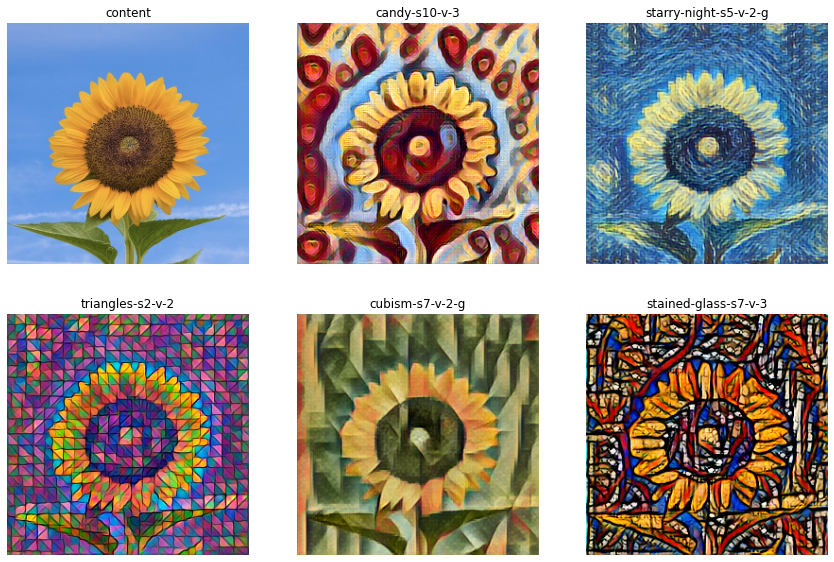

In [8]:
show_in_styles('img/sunflower.jpeg',
    r'(candy-s10-v-3)|(starry-night-s5-v-2-g)|(triangles-s2-v-2)'
    r'|(cubism-s7-v-2-g)|(stained-glass-s7-v-3)',
    min_dim=256, show_original=True, save=True, n_cols=3, width=14.7
)

And here are the same styles applied to a photo of the german mining museum during pride month.  Note that these images are 320x320 pixels while the sunflower was 256x256.  This makes a significant difference &mdash; modify the `min_dim` parameter below and see for yourself.

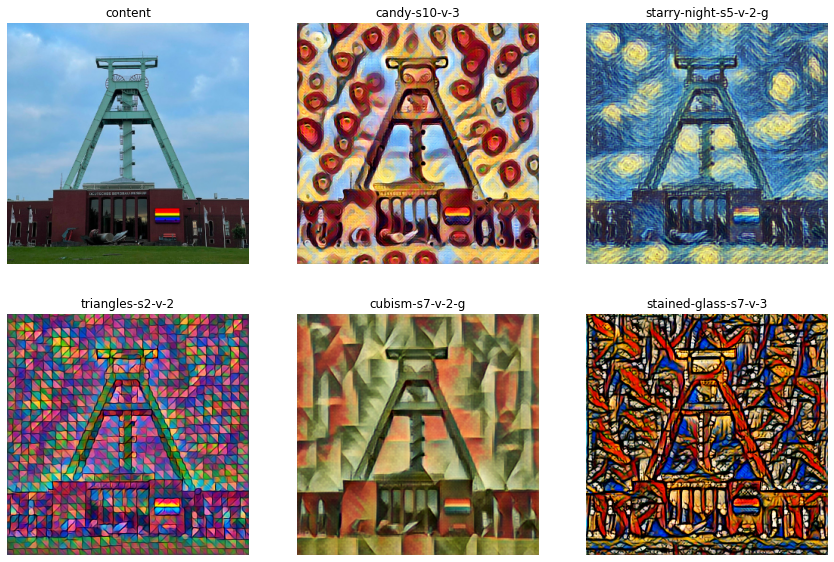

In [9]:
show_in_styles('img/bergbau-museum.jpeg',
    r'(candy-s10-v-3)|(starry-night-s5-v-2-g)|(triangles-s2-v-2)'
    r'|(cubism-s7-v-2-g)|(stained-glass-s7-v-3)',
    min_dim=320, show_original=True, save=True, n_cols=3, width=14.7
)

And here is one more set for good measure.  This photo of the Chicago skyline is one of the original examples from Johnson's article [1].

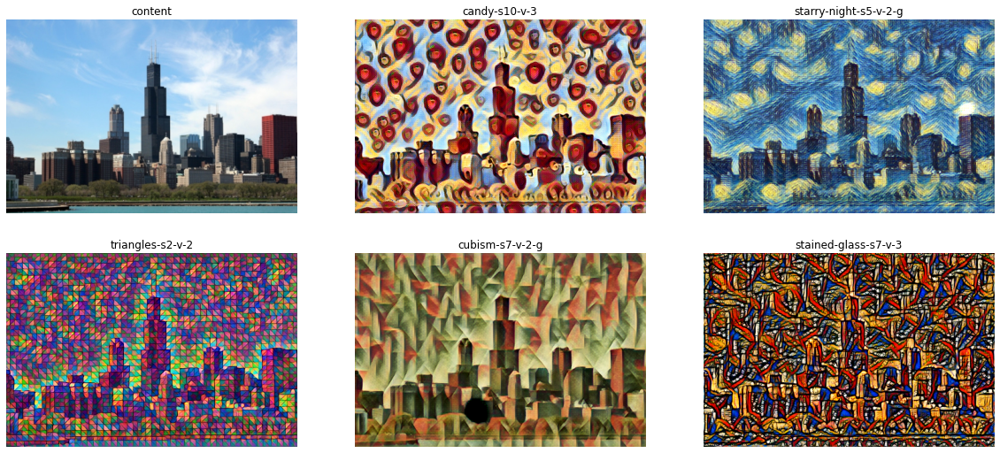

In [10]:
show_in_styles('img/chicago.jpeg',
    r'(candy-s10-v-3)|(starry-night-s5-v-2-g)|(triangles-s2-v-2)'
    r'|(cubism-s7-v-2-g)|(stained-glass-s7-v-3)',
    min_dim=384, show_original=True, save=True, n_cols=3
)

I chose the parameters used in the stylizations above by doing a grid search for style and variation loss weights (while keeping the content loss weight at 1.0.)  See below for some of these grids.  First up: the `candy` style from Johnson's work.

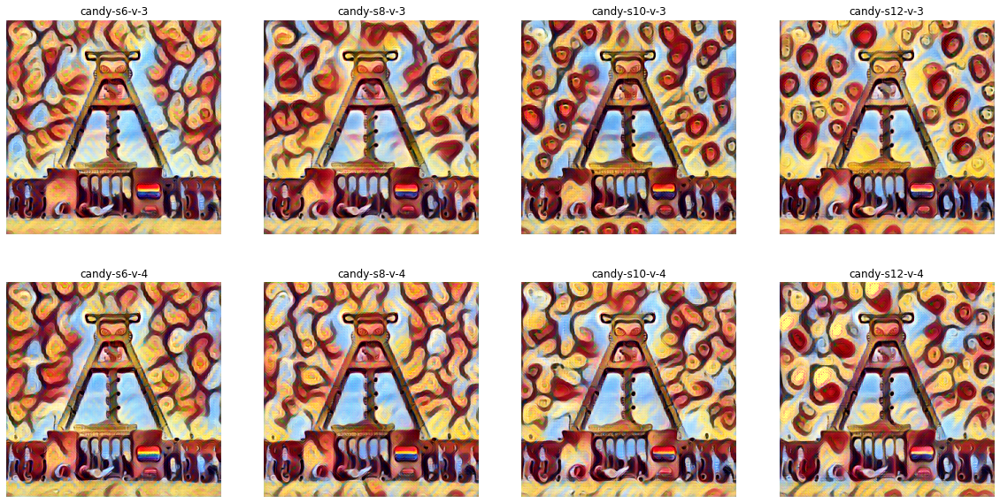

In [11]:
show_in_styles('img/bergbau-museum.jpeg', r'candy-.*(?<!-in)', min_dim=320)

There is one other parameter: In later work by Ulyanov et al [7] they suggested using instance normalization instead of the batch normalization layers in Johnson's transfer model.  I have implemented this option as well.  The stylizations in the top and bottom row below were created using the same parameters, except the top row used batch normalization while the bottom row used instance normalization.  Instance normalization can lead to significantly better results, unfortunately it also increases the training time by roughly 30%.

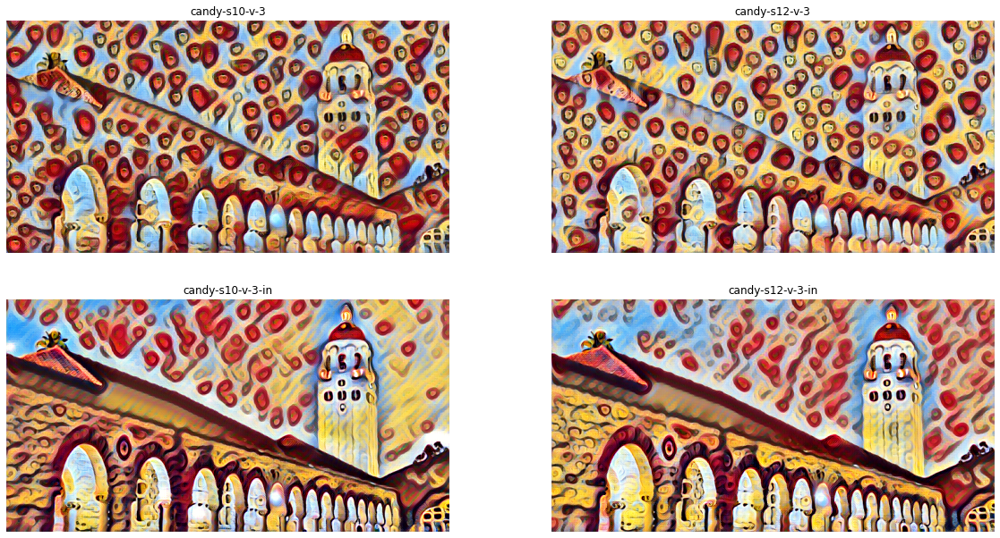

In [12]:
show_in_styles('img/stanford.jpeg', r'candy-s1.-v-3(-in)?', n_cols=2)

These are some sunflowers in the `stained-glass` style.  I quite like these images of the sunflower, but the results of applying this style to the mining museum or chicago skyline images are underwhelming in my opinion.

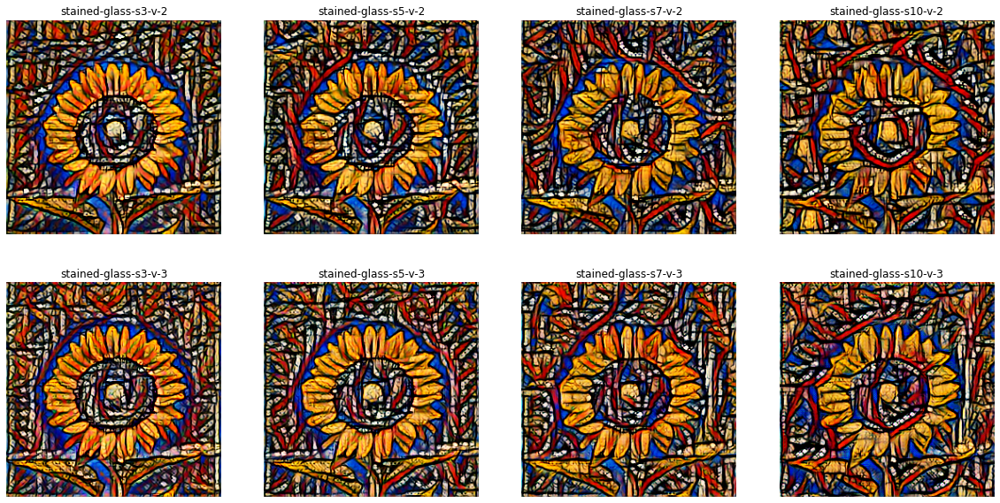

In [13]:
show_in_styles('img/sunflower.jpeg', r'stained-glass-s(3|5|7|10)-v-.', min_dim=256)

Here is another set, this time with Gatys' type weights with a stronger focus on the deeper layers.

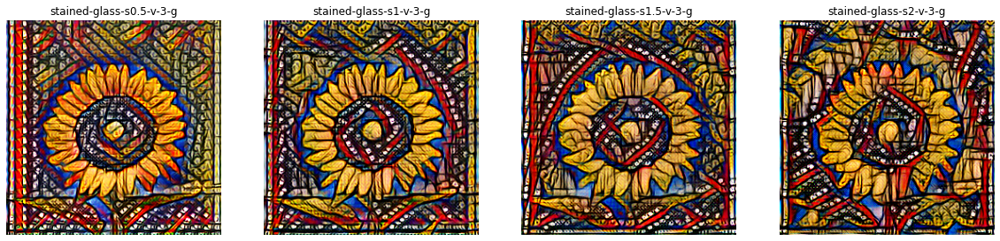

In [14]:
show_in_styles('img/sunflower.jpeg', r'stained-glass-s.*-g', min_dim=256)

These are some sunflowers in the `fractal` style.  This style worked very well for Gatys' stylization but is not very convincing here.

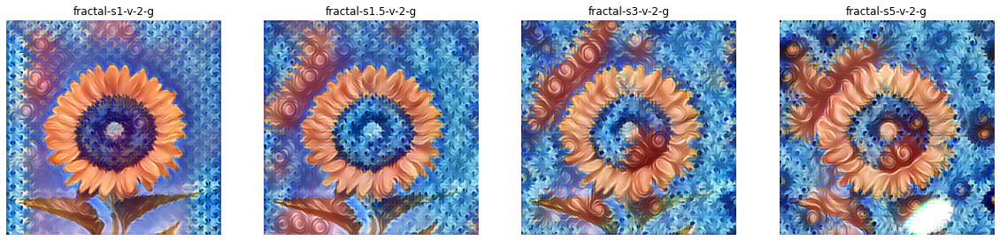

In [15]:
show_in_styles('img/sunflower.jpeg', r'fractal-.*', min_dim=256)

Here are a couple of stylizations of the chicago skyline.  The style, of course, is van Gogh's starry night.

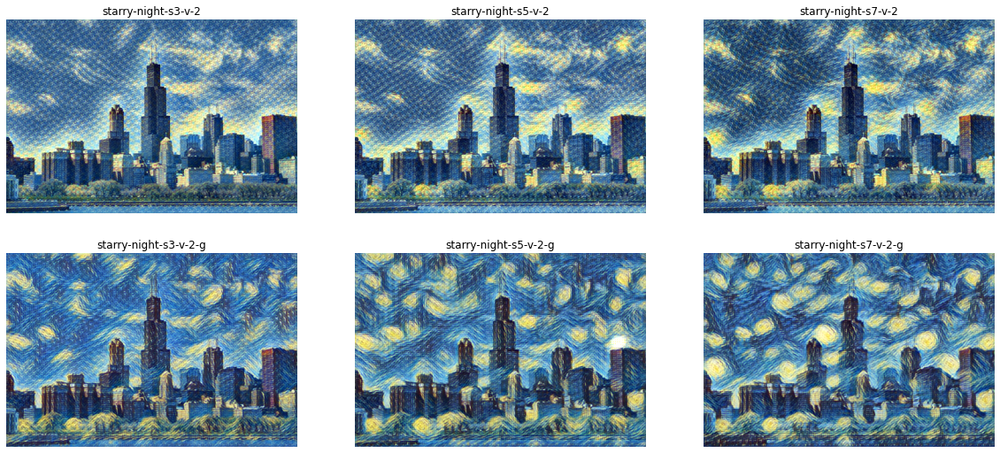

In [16]:
show_in_styles('img/chicago.jpeg', r'(starry-night-s.-v-2.*)', min_dim=384, n_cols=3)

And finally the same skyline in a cubist style.  Note the white holes in one of the stylizations.  These artifacts occasionally show up but disappear with longer training.

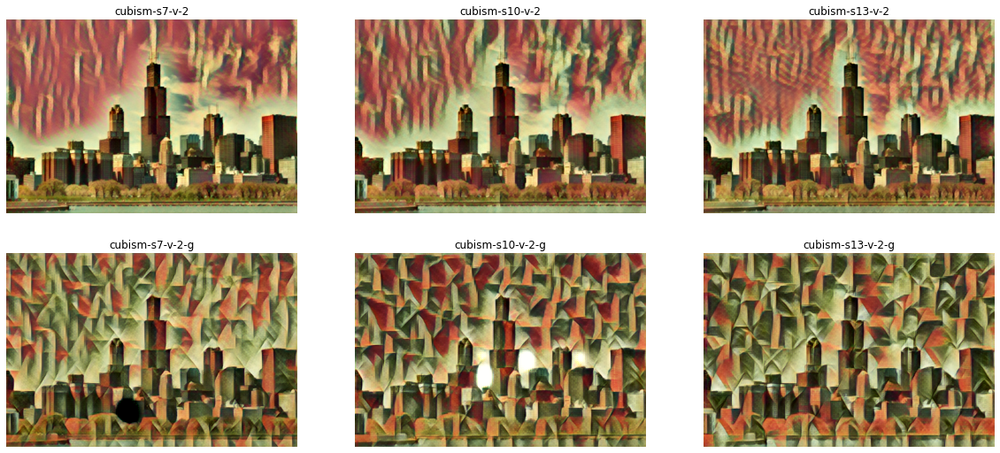

In [17]:
show_in_styles('img/chicago.jpeg', r'cubism-s(7|10|13)-v-2.*', min_dim=384, n_cols=3)

Since stylization using a single forward-pass of the network is so efficient it can be used on video streams, too.  Johnson in his code [3] includes a demonstration of live stylization using a webcam.  The function below lets you stylize an animated gif.  Not quite as impressive, but fun nonetheless!

In [18]:
def stylize_gif(gif_file, style, save=True):
    model = nst.models.JohnsonStyleTransfer.from_checkpoint(
        f'./weights/johnson2016-{style}-2.h5'
    )

    raw = tf.io.read_file(gif_file)
    img = tf.image.decode_gif(raw)
    img = tf.cast(img, tf.float32)

    stylized = model(img)
    stylized = [
        tf.keras.utils.array_to_img(frame)
        for frame in tf.unstack(stylized)
    ]

    if save is True:
        content = os.path.splitext( os.path.basename(gif_file) )[0]
        stylized_gif_file = f'results/johnson2016-{content}-{style}.gif'

        if not os.path.exists(stylized_gif_file):
            stylized[0].save(stylized_gif_file, loop=0, duration=100,
                save_all=True, append_images=stylized[1:])

In [19]:
stylize_gif('img/bugs-bunny.gif', 'starry-night-s3-v-2-g')

![](https://github.com/mdehling/neural-style-transfer/raw/main/results/johnson2016-bugs-bunny-starry-night-s3-v-2-g.gif)

# References
1. Johnson, Alahi, Fei-Fei - _Perceptual Losses for Real-Time Style Transfer and Super-Resolution_, 2016.
2. Johnson, Alahi, Fei-Fei - _Perceptual Losses for Real-Time Style Transfer and Super-Resolution - Supplementary Material_, 2016.
3. Johnson - https://github.com/jcjohnson/fast-neural-style
4. Lin et al - _Microsoft COCO: Common Objects in Context_, 2014.
5. Gatys, Ecker, Bethge - _Texture Synthesis Using Convolutional Neural Networks_, 2015.
6. Gatys, Ecker, Bethge - _A Neural Algorithm of Artistic Style_, 2015.
7. Ulyanov, Vedaldi, Lempitsky - _Instance Normalization: The Missing Ingredient for Fast Stylization_, 2016.